In [1]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import math
from tqdm import tqdm

In [2]:
device = 'cpu'

In [3]:
# Random generators for reproducibility
X_train_gen = torch.Generator(device=device)   
X_train_gen.manual_seed(1) 
X_test_gen = torch.Generator(device=device) 
Noise_gen = torch.Generator()
Noise_gen.manual_seed(5)
Sample_gen = torch.Generator(device=device)
Sample_gen.manual_seed(3)

In [4]:
# helper functions
def mse(X,Y):
    losses = (X-Y)**2
    return losses.mean()

def single_index(n, d, gen, device="cpu"):
    theta = torch.ones(d).to(device) * 1
    theta[1:] = 0
    X =  torch.normal(mean = 0, std = 1, size = (n, d), device = device, requires_grad = False, generator = gen)
    Y = X @ theta
    return X, Y

def var(X):
    return torch.var(X)
    
def second_moment(X):
    return var(X) + (torch.mean(X)) ** 2

In [5]:
# Parameters
mode = "ntk"
d = 20        # input dimension
m = 1000      # neuron width
n = 200       # number of data

eta_1 = 1e-3   # learning rate for W
eta_2 = 0      # learning rate for a (controlled by oscillations)

label_noise = False  # whether to use label noise
B = 1                # batch size
k_sigma = 0          # label noise scale
k_1 = 1/d * k_sigma  # +- constant
epoch_num = 100001   # number of steps
criterion = mse      # loss function

In [6]:
class TwoLayerNN(nn.Module):
    def __init__(self, d, m, scale="ntk"):
        super(TwoLayerNN, self).__init__()
        W1_gen = torch.Generator()
        W1_gen.manual_seed(4) 
        W2_gen = torch.Generator()
        W2_gen.manual_seed(3)

        # Initialize W (m,d)
        W = torch.randn(m, d, generator=W1_gen) 
        W = W / (d ** 0.5)
        self.W = nn.Parameter(W, requires_grad=True)

        # Initialize a~N(0,1) (m,1)
        a = torch.randn(m, 1, generator=W2_gen)
        a = a / (m ** 0.5)

        for i in range(m):
            values = torch.tensor( [(eta_1 ** 0.25), 0, -(eta_1 ** 0.25)])  
            probs = torch.tensor([1/4, 1/2, 1/4])  
            index = torch.multinomial(probs, 1)
            selected_value = values[index]
            a[i][0] = selected_value
          
        self.a = nn.Parameter(a, requires_grad=True)
        self.scale = scale
        self.m = m

    def forward(self, X): #X:(n,d) W:(m,d) a:(m,1)
        # ntk setting: /sqrt(d)/sqrt(m)
        output = X @ self.W.T @ self.a   # shape: (T, n, m)
        return output

In [7]:
# Generate training and test data
X_GD,Y_GD = single_index(n, d, X_train_gen, device=device)
X_test, Y_test = single_index(n, d, X_test_gen, device=device)
print(X_GD)
print(Y_GD[:10])
print(X_test)
print(Y_test[:10])

tensor([[-1.5256, -0.7502, -0.6540,  ..., -1.1608,  0.6995,  0.1991],
        [ 0.8657,  0.2444, -0.6629,  ...,  0.0457,  0.1530, -0.4757],
        [-0.1110,  0.2927, -0.1578,  ...,  0.9386, -0.1860, -0.6446],
        ...,
        [ 0.6381, -0.3540, -0.5431,  ...,  1.9151, -0.6811,  0.7034],
        [-0.8180, -0.4039, -1.2104,  ..., -1.0875, -0.2432, -0.0727],
        [ 0.0742,  0.5778, -1.0970,  ..., -1.1242,  0.9775,  0.7015]])
tensor([-1.5256,  0.8657, -0.1110,  1.5392, -0.5065,  1.3851,  2.5581,  2.2952,
         0.4175, -0.9640])
tensor([[-0.1737, -1.8225,  0.7792,  ..., -1.9745,  1.5358,  0.5033],
        [ 1.2364, -0.7147,  0.0041,  ..., -0.9549,  0.3995,  0.1250],
        [ 2.0879, -0.2450, -0.2927,  ...,  1.0148, -0.1364,  1.0802],
        ...,
        [-0.6677,  1.2787,  1.1509,  ..., -0.4065,  0.4354, -0.6589],
        [-0.1866, -1.1444, -1.3670,  ...,  0.4300, -2.3673,  0.1478],
        [ 0.5755, -0.4983, -0.9520,  ...,  0.9588, -0.6980, -0.3095]])
tensor([-0.1737,  1.2364,

In [8]:
# Create model
torch.cuda.empty_cache()
model = TwoLayerNN(d, m,scale=mode).to(device)

W1_list = []
W2_list = []

losses = []
total_losses = []
test_losses = []
indexes_large_loss = []

check_num = 248
check_pos = [i * (epoch_num // check_num) for i in range(check_num)]
check_idx = 0

print(check_pos)
print(model.a)

[0, 403, 806, 1209, 1612, 2015, 2418, 2821, 3224, 3627, 4030, 4433, 4836, 5239, 5642, 6045, 6448, 6851, 7254, 7657, 8060, 8463, 8866, 9269, 9672, 10075, 10478, 10881, 11284, 11687, 12090, 12493, 12896, 13299, 13702, 14105, 14508, 14911, 15314, 15717, 16120, 16523, 16926, 17329, 17732, 18135, 18538, 18941, 19344, 19747, 20150, 20553, 20956, 21359, 21762, 22165, 22568, 22971, 23374, 23777, 24180, 24583, 24986, 25389, 25792, 26195, 26598, 27001, 27404, 27807, 28210, 28613, 29016, 29419, 29822, 30225, 30628, 31031, 31434, 31837, 32240, 32643, 33046, 33449, 33852, 34255, 34658, 35061, 35464, 35867, 36270, 36673, 37076, 37479, 37882, 38285, 38688, 39091, 39494, 39897, 40300, 40703, 41106, 41509, 41912, 42315, 42718, 43121, 43524, 43927, 44330, 44733, 45136, 45539, 45942, 46345, 46748, 47151, 47554, 47957, 48360, 48763, 49166, 49569, 49972, 50375, 50778, 51181, 51584, 51987, 52390, 52793, 53196, 53599, 54002, 54405, 54808, 55211, 55614, 56017, 56420, 56823, 57226, 57629, 58032, 58435, 58838, 

In [9]:
Spec_neuron_check_num = 3
W1_check_pos = [i * 29 for i in range(Spec_neuron_check_num)]
W2_check_pos = [i * 29 for i in range(Spec_neuron_check_num)]

Spec_neuron_check_num += 2
W1_check_pos.append(58)
W1_check_pos.append(13)
W2_check_pos.append(58)
W2_check_pos.append(13)

W1_spec_norm = []
W1_spec_cossim = []
W2_check_list = []
W1_W1pre_spec_vari = []
for i in range(Spec_neuron_check_num):
     W1_spec_norm.append([])
     W1_spec_cossim.append([])
     W2_check_list.append([])
     W1_W1pre_spec_vari.append([])

In [10]:
# initial value

W1_list.append(model.W.detach().clone())
W2_list.append(model.a.detach().clone())

In [11]:
# find the hign and low alignment neuron

high_value = 0.6
low_value = 0.01
count_1 = 0
count_2 = 0 
for i in range(m):
     # find the high alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) > high_value and count_1 <= 2:
          Spec_neuron_check_num += 1
          count_1 += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

     # find the low alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) < low_value and count_2 <= 2:
          count_2 += 1
          Spec_neuron_check_num += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

27 0.009812478078201726
95 -0.0030371507872257986
139 -0.009542776843035644
524 0.6038194083401222
568 0.6840742892533226
676 -0.6222550248665116


In [12]:
for i in range(Spec_neuron_check_num):
     W1_spec_norm[i].append(W1_list[0][W1_check_pos[i]].norm().item())
     W2_check_list[i].append(W2_list[0][W2_check_pos[i]].norm().item())
     W1_spec_cossim[i].append(W1_list[0][W1_check_pos[i]][0].item() / W1_list[0][W1_check_pos[i]].norm().item())
     W1_W1pre_spec_vari.append(W1_list[0][W1_check_pos[i]].norm().item())
     
check_idx += 1
print(W1_spec_norm)
print(W1_spec_cossim)
print(W2_check_list)

[[1.0390665531158447], [0.99335777759552], [0.927873432636261], [0.927873432636261], [1.361335277557373], [1.1725544929504395], [0.8880513310432434], [0.946675181388855], [0.9641717672348022], [1.2185946702957153], [0.9478635787963867]]
[[-0.20259253272194397], [-0.14284127629685214], [-0.2540422343664694], [-0.2540422343664694], [0.28773231329557636], [0.009812478078201726], [-0.0030371507872257986], [-0.009542776843035644], [0.6038194083401222], [0.6840742892533226], [-0.6222550248665116]]
[[0.0], [0.0], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.0], [0.17782793939113617], [0.17782793939113617], [0.0], [0.0]]


In [13]:
W1_norm_means = []
W2_norm_means = []
W1_pre = torch.zeros(m).unsqueeze(1).to(device)
W2_pre = torch.zeros(m).unsqueeze(1).to(device)

In [14]:
optimizer = optim.SGD([{'params': model.W, 'lr': eta_1},{'params': model.a, 'lr': eta_2}])

indices = range(n)
X = X_GD[indices,:].to(device)
Y = Y_GD[indices].to(device)

theta = torch.ones(d).to(device) * 1
theta[1:] = 0

for i in tqdm(range(epoch_num)):
     model.zero_grad()
     with torch.no_grad():
          if check_idx < check_num and check_pos[check_idx] == i:
               W1_temp = model.W.detach().clone()
               W2_temp = model.a.detach().clone()
               W1_list.append(W1_temp)
               W2_list.append(W2_temp)
               check_idx += 1

     N = 2 * torch.randint(0, 2, (n,1), generator = Noise_gen).squeeze() - 1
     N = N.to(device)
     if(label_noise):
          Y_noisy = Y + k_1 * N
     else:
          Y_noisy = Y
     
     output = model(X).squeeze()
     loss = criterion(output,Y_noisy)
     
     Y_tmp = model(X_GD).squeeze()
     Y_tmp_test = model(X_test).squeeze()

     with torch.no_grad():
          losses.append(loss.item())
          total_losses.append(criterion(Y_tmp, Y_GD).item())
          test_losses.append(criterion(Y_tmp_test, Y_test).item())
          if loss.item() > 1:
               indexes_large_loss.append(i)

          W1_temp = model.W.detach().clone()
          W2_temp = model.a.detach().clone()

          # compute the mean
          W1_norms = torch.norm(W1_temp, dim=1)
          mean_norm = W1_norms.mean().item() 
          W1_norm_means.append(mean_norm)

          W2_norms = torch.norm(W2_temp, dim=1)
          mean_norm = W2_norms.mean().item() 
          W2_norm_means.append(mean_norm)

          for j in range(Spec_neuron_check_num):
               W2_check_list[j].append(W2_temp[W2_check_pos[j]].item())
               W1_spec_norm[j].append(W1_temp[W1_check_pos[j]].norm().item())
               W1_spec_cossim[j].append(W1_temp[W1_check_pos[j]][0].item() / W1_temp[W1_check_pos[j]].norm().item())
               W1_W1pre_spec_vari[j].append((W1_temp[W2_check_pos[j]] * W1_pre[W2_check_pos[j]]).sum().item())

          W1_pre = W1_temp
          W2_pre = W2_temp
               
     loss.backward()
     optimizer.step()

     # Every 5000 steps, add or stop adding oscillations to the second layer
     with torch.no_grad():
          if i % 10000 >= 5000:
               N1 = (2 * torch.randint(0, 2, (m,1), generator = Noise_gen) - 1) * (eta_1 ** 0.25)
               N1 = N1.to(device)
               mask_1 = model.a >= (eta_1 ** 0.25)
               mask_2 = model.a <= -(eta_1 ** 0.25)
               mask_3 = model.a.abs() < (eta_1 ** 0.25)
               model.a[mask_1] -= abs(N1[mask_1])
               model.a[mask_2] += abs(N1[mask_2])
               model.a[mask_3] += N1[mask_3]

     if(i % 1000 == 0):
          with torch.no_grad():
               print("loss:",criterion(model(X).squeeze(),Y))
               print("total_loss:",criterion(Y_tmp, Y_GD))
               print("test_loss:",criterion(Y_tmp_test, Y_test))
model.zero_grad()

  0%|          | 22/100001 [00:00<07:42, 216.21it/s]

loss: tensor(8.5254)
total_loss: tensor(9.1244)
test_loss: tensor(8.2693)


  1%|          | 1043/100001 [00:05<07:15, 227.41it/s]

loss: tensor(4.1603e-10)
total_loss: tensor(4.1803e-10)
test_loss: tensor(8.1386e-10)


  2%|▏         | 2031/100001 [00:10<06:48, 239.54it/s]

loss: tensor(4.7977e-11)
total_loss: tensor(4.7970e-11)
test_loss: tensor(9.4062e-11)


  3%|▎         | 3056/100001 [00:13<05:32, 291.31it/s]

loss: tensor(1.7973e-11)
total_loss: tensor(1.7981e-11)
test_loss: tensor(3.4808e-11)


  4%|▍         | 4061/100001 [00:17<05:35, 286.06it/s]

loss: tensor(9.4770e-12)
total_loss: tensor(9.4826e-12)
test_loss: tensor(1.8403e-11)


  5%|▌         | 5010/100001 [00:20<06:41, 236.53it/s]

loss: tensor(27.2622)
total_loss: tensor(6.3714e-12)
test_loss: tensor(1.2238e-11)


  6%|▌         | 6011/100001 [00:27<25:27, 61.53it/s] 

loss: tensor(16.1942)
total_loss: tensor(20.6406)
test_loss: tensor(19.2099)


  7%|▋         | 7053/100001 [00:32<06:31, 237.14it/s]

loss: tensor(14.6601)
total_loss: tensor(14.1558)
test_loss: tensor(15.3933)


  8%|▊         | 8031/100001 [00:37<06:48, 225.19it/s]

loss: tensor(24.9216)
total_loss: tensor(15.3939)
test_loss: tensor(12.9612)


  9%|▉         | 9034/100001 [00:42<06:23, 236.96it/s]

loss: tensor(5.3811)
total_loss: tensor(17.1377)
test_loss: tensor(15.2359)


 10%|█         | 10030/100001 [00:47<06:24, 233.83it/s]

loss: tensor(11.2932)
total_loss: tensor(12.1730)
test_loss: tensor(10.9630)


 11%|█         | 11059/100001 [00:50<05:02, 294.07it/s]

loss: tensor(1.3225e-10)
total_loss: tensor(1.3294e-10)
test_loss: tensor(2.2426e-10)


 12%|█▏        | 12048/100001 [00:54<04:49, 303.77it/s]

loss: tensor(1.8799e-11)
total_loss: tensor(1.8809e-11)
test_loss: tensor(3.1837e-11)


 13%|█▎        | 13037/100001 [00:57<05:06, 283.49it/s]

loss: tensor(7.5369e-12)
total_loss: tensor(7.5602e-12)
test_loss: tensor(1.1893e-11)


 14%|█▍        | 14047/100001 [01:01<05:03, 282.76it/s]

loss: tensor(4.0619e-12)
total_loss: tensor(4.0541e-12)
test_loss: tensor(6.4164e-12)


 15%|█▌        | 15025/100001 [01:05<05:05, 278.02it/s]

loss: tensor(12.0278)
total_loss: tensor(2.6090e-12)
test_loss: tensor(3.8025e-12)


 16%|█▌        | 16036/100001 [01:09<06:10, 226.62it/s]

loss: tensor(18.8838)
total_loss: tensor(16.7456)
test_loss: tensor(12.8248)


 17%|█▋        | 17047/100001 [01:14<05:33, 249.09it/s]

loss: tensor(8.1615)
total_loss: tensor(13.4895)
test_loss: tensor(15.7350)


 18%|█▊        | 18041/100001 [01:19<06:34, 207.74it/s]

loss: tensor(7.5333)
total_loss: tensor(7.1712)
test_loss: tensor(8.8226)


 19%|█▉        | 19047/100001 [01:23<05:33, 243.04it/s]

loss: tensor(6.3790)
total_loss: tensor(7.8598)
test_loss: tensor(9.7356)


 20%|██        | 20035/100001 [01:28<05:06, 260.70it/s]

loss: tensor(12.8861)
total_loss: tensor(13.8816)
test_loss: tensor(12.7868)


 21%|██        | 21040/100001 [01:31<05:34, 235.74it/s]

loss: tensor(3.4040e-10)
total_loss: tensor(3.4174e-10)
test_loss: tensor(6.3121e-10)


 22%|██▏       | 22036/100001 [01:35<05:03, 257.13it/s]

loss: tensor(3.4533e-11)
total_loss: tensor(3.4549e-11)
test_loss: tensor(6.4294e-11)


 23%|██▎       | 23040/100001 [01:38<03:39, 350.25it/s]

loss: tensor(1.1202e-11)
total_loss: tensor(1.1201e-11)
test_loss: tensor(2.0644e-11)


 24%|██▍       | 24046/100001 [01:41<03:20, 378.16it/s]

loss: tensor(6.2172e-12)
total_loss: tensor(6.2159e-12)
test_loss: tensor(1.1581e-11)


 25%|██▌       | 25036/100001 [01:44<03:55, 318.64it/s]

loss: tensor(6.0795)
total_loss: tensor(3.8969e-12)
test_loss: tensor(7.2992e-12)


 26%|██▌       | 26022/100001 [01:48<04:17, 287.36it/s]

loss: tensor(11.5470)
total_loss: tensor(8.2023)
test_loss: tensor(10.2681)


 27%|██▋       | 27052/100001 [01:52<04:13, 287.51it/s]

loss: tensor(6.9271)
total_loss: tensor(11.2994)
test_loss: tensor(10.8425)


 28%|██▊       | 28046/100001 [01:56<04:01, 297.65it/s]

loss: tensor(5.1011)
total_loss: tensor(4.9491)
test_loss: tensor(5.7072)


 29%|██▉       | 29045/100001 [02:00<04:08, 285.09it/s]

loss: tensor(6.3040)
total_loss: tensor(3.7173)
test_loss: tensor(4.1329)


 30%|███       | 30073/100001 [02:04<04:21, 267.45it/s]

loss: tensor(4.2265)
total_loss: tensor(4.4742)
test_loss: tensor(5.8737)


 31%|███       | 31059/100001 [02:07<03:21, 342.25it/s]

loss: tensor(1.9516e-10)
total_loss: tensor(1.9597e-10)
test_loss: tensor(3.3627e-10)


 32%|███▏      | 32034/100001 [02:11<04:37, 245.27it/s]

loss: tensor(2.3603e-11)
total_loss: tensor(2.3666e-11)
test_loss: tensor(4.0318e-11)


 33%|███▎      | 33032/100001 [02:14<04:10, 267.08it/s]

loss: tensor(8.7216e-12)
total_loss: tensor(8.7287e-12)
test_loss: tensor(1.4260e-11)


 34%|███▍      | 34049/100001 [02:18<03:00, 366.36it/s]

loss: tensor(4.7530e-12)
total_loss: tensor(4.7541e-12)
test_loss: tensor(7.7413e-12)


 35%|███▌      | 35036/100001 [02:21<03:13, 336.00it/s]

loss: tensor(5.2249)
total_loss: tensor(3.0486e-12)
test_loss: tensor(4.8570e-12)


 36%|███▌      | 36029/100001 [02:25<03:56, 270.33it/s]

loss: tensor(5.4695)
total_loss: tensor(5.8075)
test_loss: tensor(7.9460)


 37%|███▋      | 37030/100001 [02:30<06:11, 169.67it/s]

loss: tensor(4.5196)
total_loss: tensor(4.3575)
test_loss: tensor(4.4637)


 38%|███▊      | 38019/100001 [02:34<04:49, 213.80it/s]

loss: tensor(7.0001)
total_loss: tensor(7.8361)
test_loss: tensor(8.4080)


 39%|███▉      | 39066/100001 [02:38<03:22, 301.50it/s]

loss: tensor(3.6384)
total_loss: tensor(7.7314)
test_loss: tensor(7.6424)


 40%|████      | 40062/100001 [02:42<03:05, 323.03it/s]

loss: tensor(3.2517)
total_loss: tensor(3.4830)
test_loss: tensor(3.7159)


 41%|████      | 41027/100001 [02:45<03:11, 308.59it/s]

loss: tensor(1.3889e-10)
total_loss: tensor(1.3917e-10)
test_loss: tensor(2.6898e-10)


 42%|████▏     | 42044/100001 [02:49<03:10, 303.78it/s]

loss: tensor(1.5598e-11)
total_loss: tensor(1.5638e-11)
test_loss: tensor(2.9624e-11)


 43%|████▎     | 43048/100001 [02:52<02:06, 449.25it/s]

loss: tensor(5.7833e-12)
total_loss: tensor(5.7873e-12)
test_loss: tensor(1.1023e-11)


 44%|████▍     | 44037/100001 [02:55<02:08, 436.52it/s]

loss: tensor(2.8041e-12)
total_loss: tensor(2.8040e-12)
test_loss: tensor(5.3341e-12)


 45%|████▌     | 45064/100001 [02:57<02:15, 405.63it/s]

loss: tensor(6.5357)
total_loss: tensor(1.8613e-12)
test_loss: tensor(3.4083e-12)


 46%|████▌     | 46041/100001 [03:00<02:16, 394.59it/s]

loss: tensor(4.6867)
total_loss: tensor(6.1521)
test_loss: tensor(6.0277)


 47%|████▋     | 47054/100001 [03:03<02:33, 345.88it/s]

loss: tensor(6.2844)
total_loss: tensor(4.4599)
test_loss: tensor(4.5331)


 48%|████▊     | 48041/100001 [03:05<02:18, 374.35it/s]

loss: tensor(4.6441)
total_loss: tensor(4.4852)
test_loss: tensor(6.3134)


 49%|████▉     | 49058/100001 [03:09<02:29, 341.38it/s]

loss: tensor(3.6318)
total_loss: tensor(3.5502)
test_loss: tensor(2.9347)


 50%|█████     | 50073/100001 [03:12<01:57, 423.21it/s]

loss: tensor(4.0620)
total_loss: tensor(4.3519)
test_loss: tensor(3.7954)


 51%|█████     | 51088/100001 [03:14<01:37, 502.85it/s]

loss: tensor(6.3373e-11)
total_loss: tensor(6.3515e-11)
test_loss: tensor(1.1673e-10)


 52%|█████▏    | 52078/100001 [03:16<01:41, 473.67it/s]

loss: tensor(8.1259e-12)
total_loss: tensor(8.1176e-12)
test_loss: tensor(1.4668e-11)


 53%|█████▎    | 53044/100001 [03:18<01:31, 515.28it/s]

loss: tensor(3.1775e-12)
total_loss: tensor(3.1814e-12)
test_loss: tensor(5.4834e-12)


 54%|█████▍    | 54075/100001 [03:20<01:47, 425.63it/s]

loss: tensor(1.6846e-12)
total_loss: tensor(1.6881e-12)
test_loss: tensor(3.0079e-12)


 55%|█████▌    | 55048/100001 [03:22<01:42, 439.14it/s]

loss: tensor(1.5651)
total_loss: tensor(1.1001e-12)
test_loss: tensor(1.8684e-12)


 56%|█████▌    | 56083/100001 [03:25<01:46, 412.32it/s]

loss: tensor(6.3857)
total_loss: tensor(4.0226)
test_loss: tensor(4.2581)


 57%|█████▋    | 57049/100001 [03:27<01:52, 380.49it/s]

loss: tensor(2.1517)
total_loss: tensor(3.3236)
test_loss: tensor(4.3905)


 58%|█████▊    | 58056/100001 [03:30<02:02, 342.90it/s]

loss: tensor(3.6989)
total_loss: tensor(2.8662)
test_loss: tensor(2.3597)


 59%|█████▉    | 59042/100001 [03:33<01:51, 368.68it/s]

loss: tensor(3.6262)
total_loss: tensor(5.4850)
test_loss: tensor(5.6538)


 60%|██████    | 60060/100001 [03:36<01:35, 416.70it/s]

loss: tensor(1.6123)
total_loss: tensor(1.7183)
test_loss: tensor(2.2005)


 61%|██████    | 61083/100001 [03:38<01:15, 516.08it/s]

loss: tensor(6.6583e-11)
total_loss: tensor(6.6747e-11)
test_loss: tensor(1.3353e-10)


 62%|██████▏   | 62079/100001 [03:40<01:16, 494.91it/s]

loss: tensor(9.0843e-12)
total_loss: tensor(9.1049e-12)
test_loss: tensor(1.8121e-11)


 63%|██████▎   | 63045/100001 [03:42<01:26, 428.56it/s]

loss: tensor(3.4978e-12)
total_loss: tensor(3.4972e-12)
test_loss: tensor(6.7746e-12)


 64%|██████▍   | 64056/100001 [03:45<01:19, 451.49it/s]

loss: tensor(1.9360e-12)
total_loss: tensor(1.9402e-12)
test_loss: tensor(3.7407e-12)


 65%|██████▌   | 65044/100001 [03:47<01:21, 431.17it/s]

loss: tensor(7.7554)
total_loss: tensor(1.2494e-12)
test_loss: tensor(2.3864e-12)


 66%|██████▌   | 66050/100001 [03:51<01:46, 318.01it/s]

loss: tensor(5.5206)
total_loss: tensor(1.3854)
test_loss: tensor(1.3799)


 67%|██████▋   | 67059/100001 [03:54<01:42, 321.99it/s]

loss: tensor(2.0946)
total_loss: tensor(2.6890)
test_loss: tensor(3.3172)


 68%|██████▊   | 68054/100001 [03:57<01:54, 280.11it/s]

loss: tensor(3.9891)
total_loss: tensor(1.9017)
test_loss: tensor(2.1104)


 69%|██████▉   | 69066/100001 [04:00<01:26, 357.92it/s]

loss: tensor(1.6140)
total_loss: tensor(2.7051)
test_loss: tensor(2.7049)


 70%|███████   | 70071/100001 [04:02<01:08, 439.58it/s]

loss: tensor(2.0353)
total_loss: tensor(2.1676)
test_loss: tensor(2.3621)


 71%|███████   | 71077/100001 [04:04<00:55, 517.97it/s]

loss: tensor(9.1653e-11)
total_loss: tensor(9.2050e-11)
test_loss: tensor(1.6845e-10)


 72%|███████▏  | 72115/100001 [04:07<00:54, 510.36it/s]

loss: tensor(9.1398e-12)
total_loss: tensor(9.1694e-12)
test_loss: tensor(1.6414e-11)


 73%|███████▎  | 73064/100001 [04:09<01:14, 361.53it/s]

loss: tensor(3.2330e-12)
total_loss: tensor(3.2326e-12)
test_loss: tensor(5.7563e-12)


 74%|███████▍  | 74057/100001 [04:11<00:51, 505.04it/s]

loss: tensor(1.7679e-12)
total_loss: tensor(1.7731e-12)
test_loss: tensor(3.2173e-12)


 75%|███████▌  | 75075/100001 [04:13<00:56, 439.21it/s]

loss: tensor(3.4282)
total_loss: tensor(1.0797e-12)
test_loss: tensor(1.8522e-12)


 76%|███████▌  | 76075/100001 [04:16<00:59, 399.35it/s]

loss: tensor(2.1628)
total_loss: tensor(1.9120)
test_loss: tensor(2.4805)


 77%|███████▋  | 77033/100001 [04:18<00:53, 428.46it/s]

loss: tensor(2.0231)
total_loss: tensor(3.2478)
test_loss: tensor(3.5972)


 78%|███████▊  | 78008/100001 [04:20<00:56, 390.82it/s]

loss: tensor(2.6338)
total_loss: tensor(3.6021)
test_loss: tensor(3.6315)


 79%|███████▉  | 79052/100001 [04:23<00:53, 390.47it/s]

loss: tensor(2.0343)
total_loss: tensor(2.4695)
test_loss: tensor(2.3524)


 80%|████████  | 80078/100001 [04:26<00:44, 450.41it/s]

loss: tensor(2.4292)
total_loss: tensor(2.5959)
test_loss: tensor(2.6840)


 81%|████████  | 81065/100001 [04:28<00:50, 372.46it/s]

loss: tensor(6.5674e-11)
total_loss: tensor(6.5920e-11)
test_loss: tensor(1.2066e-10)


 82%|████████▏ | 82089/100001 [04:30<00:36, 495.62it/s]

loss: tensor(6.7803e-12)
total_loss: tensor(6.7761e-12)
test_loss: tensor(1.2374e-11)


 83%|████████▎ | 83095/100001 [04:32<00:31, 536.76it/s]

loss: tensor(2.4422e-12)
total_loss: tensor(2.4434e-12)
test_loss: tensor(4.4715e-12)


 84%|████████▍ | 84061/100001 [04:34<00:32, 486.21it/s]

loss: tensor(1.3277e-12)
total_loss: tensor(1.3277e-12)
test_loss: tensor(2.4530e-12)


 85%|████████▌ | 85058/100001 [04:36<00:36, 406.45it/s]

loss: tensor(2.7398)
total_loss: tensor(8.4786e-13)
test_loss: tensor(1.5160e-12)


 86%|████████▌ | 86054/100001 [04:39<00:33, 415.17it/s]

loss: tensor(2.4856)
total_loss: tensor(1.5433)
test_loss: tensor(1.6902)


 87%|████████▋ | 87071/100001 [04:41<00:32, 403.02it/s]

loss: tensor(1.4758)
total_loss: tensor(1.2197)
test_loss: tensor(1.3250)


 88%|████████▊ | 88055/100001 [04:44<00:27, 430.96it/s]

loss: tensor(3.0910)
total_loss: tensor(2.2719)
test_loss: tensor(2.7128)


 89%|████████▉ | 89074/100001 [04:46<00:27, 394.26it/s]

loss: tensor(2.2337)
total_loss: tensor(1.7936)
test_loss: tensor(1.6326)


 90%|█████████ | 90051/100001 [04:49<00:25, 383.16it/s]

loss: tensor(1.2883)
total_loss: tensor(1.3889)
test_loss: tensor(1.1522)


 91%|█████████ | 91105/100001 [04:51<00:16, 530.19it/s]

loss: tensor(4.0426e-11)
total_loss: tensor(4.0472e-11)
test_loss: tensor(7.7927e-11)


 92%|█████████▏| 92055/100001 [04:53<00:16, 487.44it/s]

loss: tensor(4.6935e-12)
total_loss: tensor(4.6805e-12)
test_loss: tensor(9.0806e-12)


 93%|█████████▎| 93040/100001 [04:55<00:16, 433.06it/s]

loss: tensor(1.5800e-12)
total_loss: tensor(1.5849e-12)
test_loss: tensor(3.0392e-12)


 94%|█████████▍| 94062/100001 [04:58<00:14, 408.11it/s]

loss: tensor(7.5421e-13)
total_loss: tensor(7.5561e-13)
test_loss: tensor(1.4594e-12)


 95%|█████████▌| 95047/100001 [05:00<00:12, 408.04it/s]

loss: tensor(1.9265)
total_loss: tensor(4.5924e-13)
test_loss: tensor(8.9253e-13)


 96%|█████████▌| 96077/100001 [05:03<00:10, 381.05it/s]

loss: tensor(0.8419)
total_loss: tensor(1.2881)
test_loss: tensor(1.3643)


 97%|█████████▋| 97062/100001 [05:06<00:08, 364.23it/s]

loss: tensor(1.7197)
total_loss: tensor(2.0870)
test_loss: tensor(2.0406)


 98%|█████████▊| 98040/100001 [05:08<00:05, 390.62it/s]

loss: tensor(2.1713)
total_loss: tensor(1.1616)
test_loss: tensor(1.2265)


 99%|█████████▉| 99077/100001 [05:11<00:02, 328.13it/s]

loss: tensor(2.2409)
total_loss: tensor(1.8985)
test_loss: tensor(2.4756)


100%|██████████| 100001/100001 [05:14<00:00, 318.20it/s]

loss: tensor(1.6519)
total_loss: tensor(1.7611)
test_loss: tensor(2.1038)


In [17]:
# W1 aligment

W1_norm_list = []
W1_cos_list = []
for num in range(check_num):
     W1_norm = [W1_list[num][i].norm().item() for i in range(m)]
     W1_cos = (W1_list[num] @ theta).detach().cpu().numpy() 
     W1_cos = [W1_cos[i] / W1_list[num][i].norm().item() for i in range(m)]
     W1_norm_list.append(W1_norm)
     W1_cos_list.append(W1_cos)

print(len(W1_norm))
print(len(W1_cos))
print(indexes_large_loss)
print(W1_cos_list[0])
print(W1_cos_list[1])

1000
1000
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 5001, 5002, 5003, 5004, 5005, 5006, 5007, 5008, 5009, 5010, 5011, 5012, 5013, 5014, 5015, 5016, 5017, 5018, 5019, 5020, 5021, 5022, 5023, 5024, 5025, 5026, 5027, 5028, 5029, 5030, 5031, 5032, 5033, 5034, 5035, 5036, 5037, 5038, 5039, 5040, 5041, 5042, 5043, 5044, 5045, 5046, 5047, 5048, 5049, 5050, 5051, 5052, 5053, 5054, 5055, 5056, 5057, 5058, 5059, 5060, 5061, 5062, 5063, 5064, 5065, 5066, 5067, 5068, 5069, 5070, 5071, 5072, 5073, 5074, 5075, 5076, 5077, 5078, 5079, 5080, 5081, 5082, 5083, 5084, 5085, 5086, 5087, 5088, 5089, 5090, 5091, 5092, 5093, 5094, 5095, 5096, 5097, 5098, 5099, 5100, 5101, 5102, 5103, 5104, 5105, 5106, 5107, 5108, 5109, 5110, 5111, 5112, 5113, 5114, 5115, 5116, 5117, 5118, 5119, 5120, 5121, 5122, 5123, 5124, 5125, 5126, 5127, 5128, 5129, 5130, 5131, 5132, 5133, 5134, 5135, 5136, 5137, 5138, 5139, 5140, 5141, 5142, 5143, 5

In [18]:
# W2 observe
print(W2_list[3])
for num in range(check_num):
     W2_list[num] = W2_list[num].view(-1).tolist()
     
W2_x = [j for j in range(m)]
print(W2_x)
print(W2_list[1])

tensor([[ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.1778],
        [-0.1778],
        [ 0.1778],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [ 0.1778],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [ 0.1778],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [ 0.0000],
        [-0.

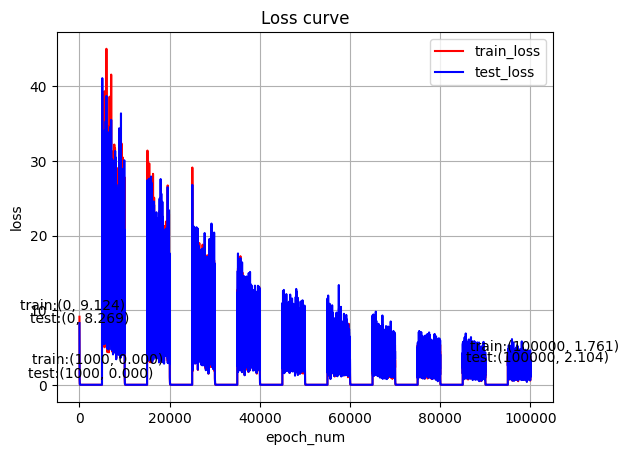

In [20]:
# plot loss

import matplotlib.pyplot as plt
mid_point = 1000
plt.figure()  
x = range(0, epoch_num)
plt.plot(x, losses, label='train_loss', color='red')
plt.plot(x, test_losses, label = 'test_loss', color='blue')
plt.annotate(f'train:({x[0]}, {losses[0]:.3f})',  
                 (x[0], losses[0]),
                 textcoords="offset points",     
                 xytext=(-5, 5),        
                 ha='center') 
plt.annotate(f'test:({x[0]}, {test_losses[0]:.3f})',  
                 (x[0], test_losses[0]),  
                 textcoords="offset points",     
                 xytext=(0,0),      
                 ha='center') 
plt.annotate(f'train:({x[mid_point]}, {losses[mid_point]:.3f})',  
                 (x[mid_point], losses[mid_point]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[mid_point]}, {test_losses[mid_point]:.3f})',  
                 (x[mid_point], test_losses[mid_point]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center')  
plt.annotate(f'train:({x[epoch_num - 1]}, {losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], losses[epoch_num - 1]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[epoch_num - 1]}, {test_losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], test_losses[epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)      
plt.title('Loss curve')
plt.xlabel('epoch_num')  
plt.ylabel('loss')  
# plt.ylim(0,40)  
plt.legend()  
plt.grid(True)  
plt.show()  

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


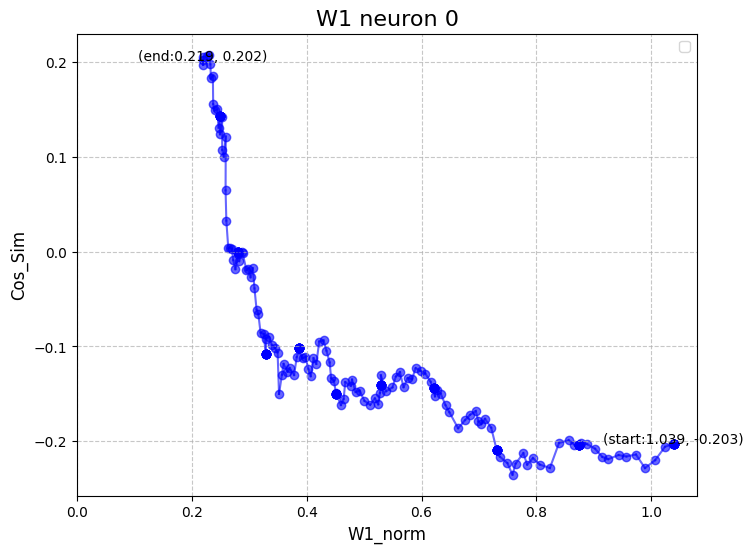

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


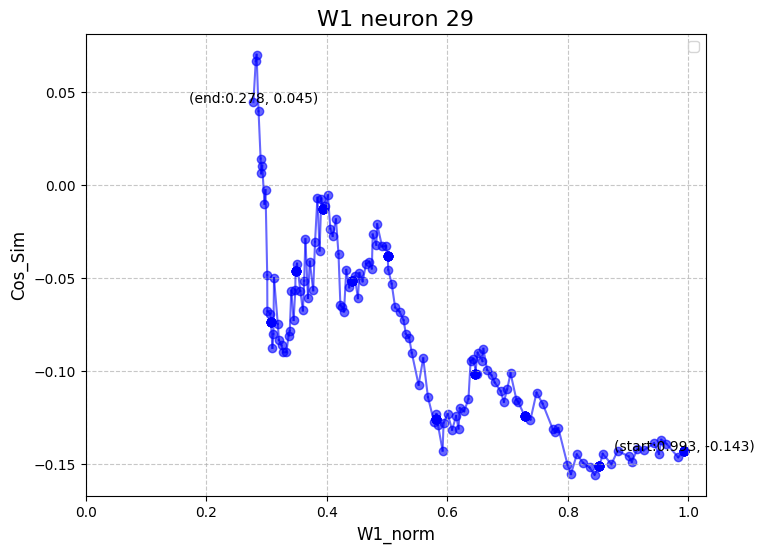

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


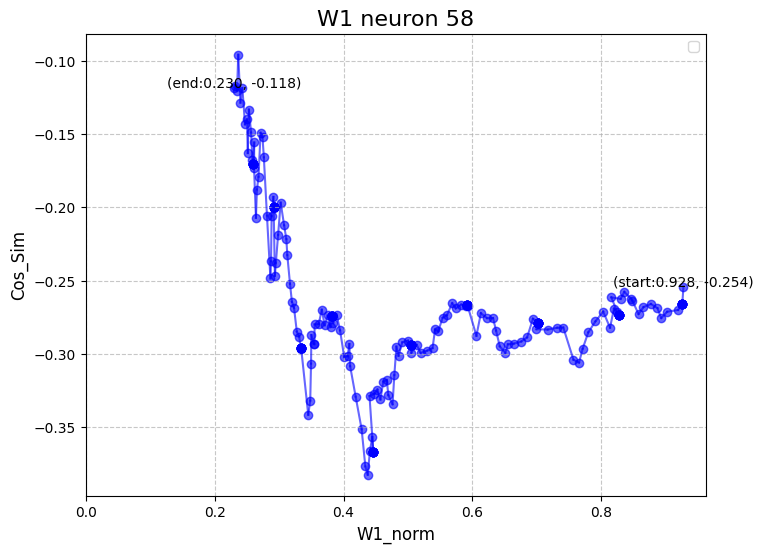

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


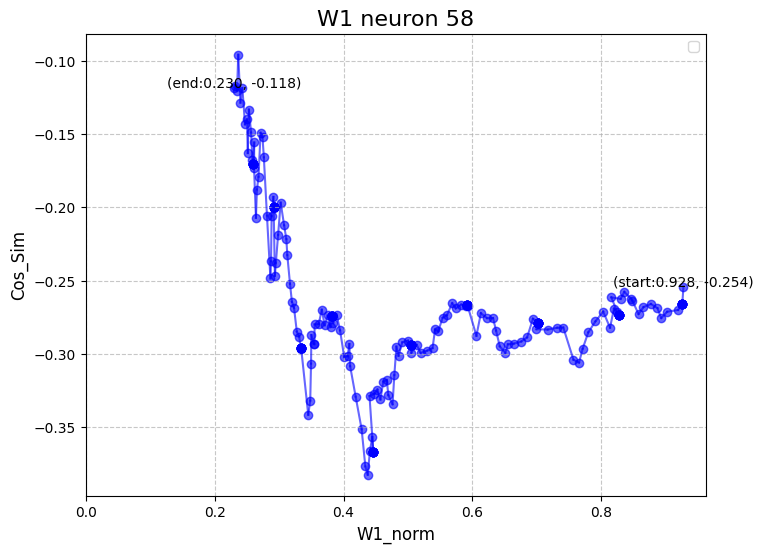

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


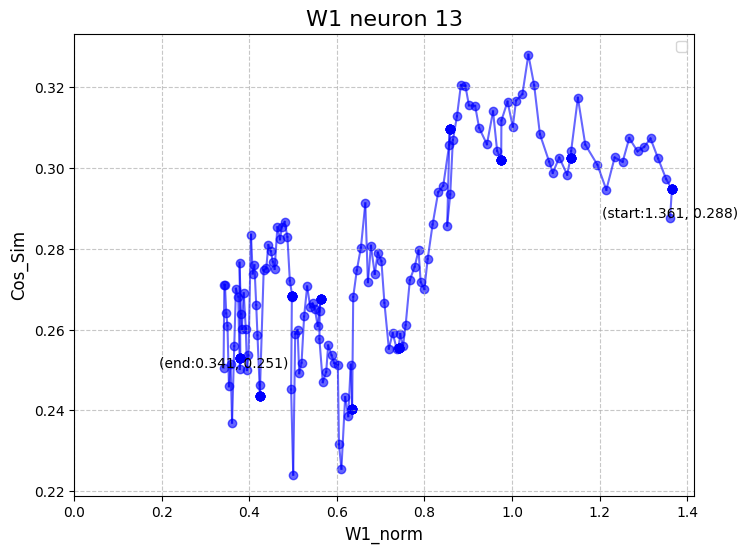

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


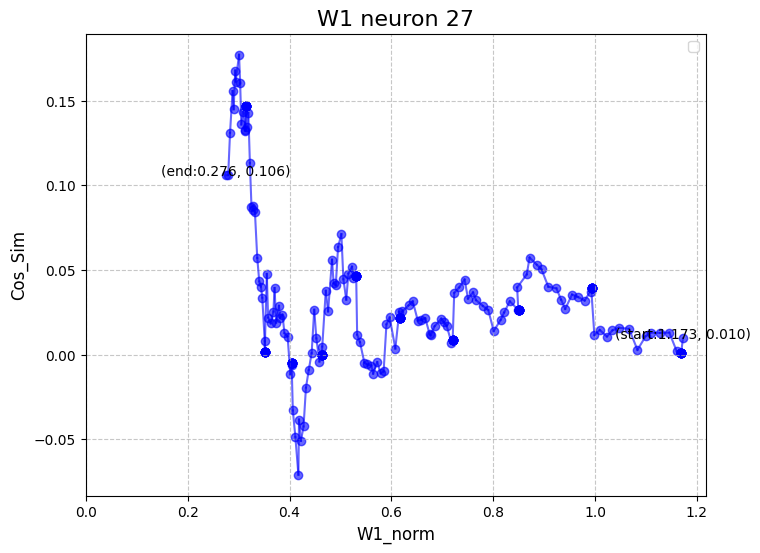

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


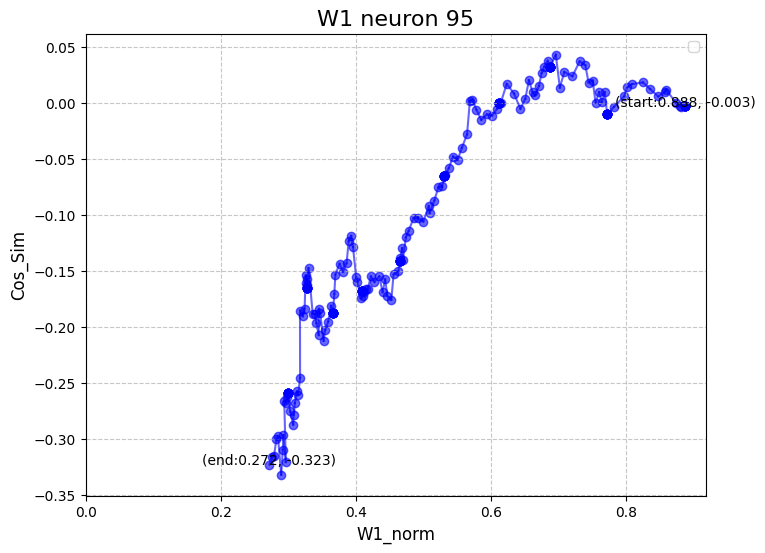

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


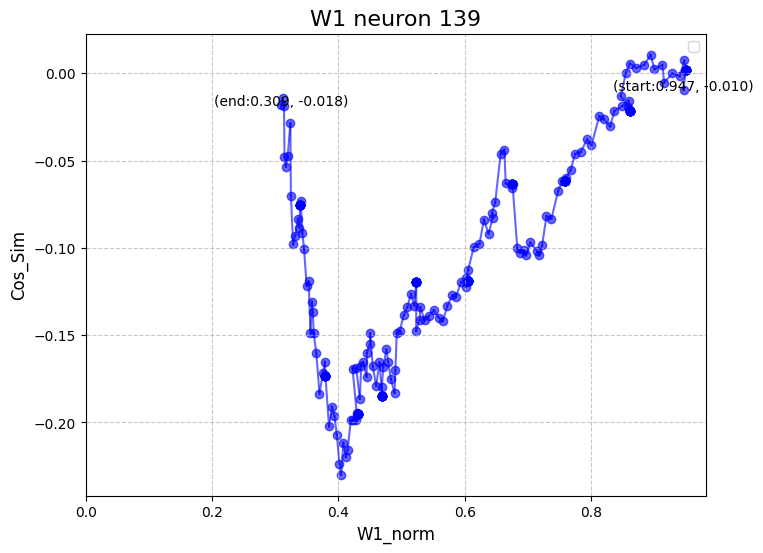

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


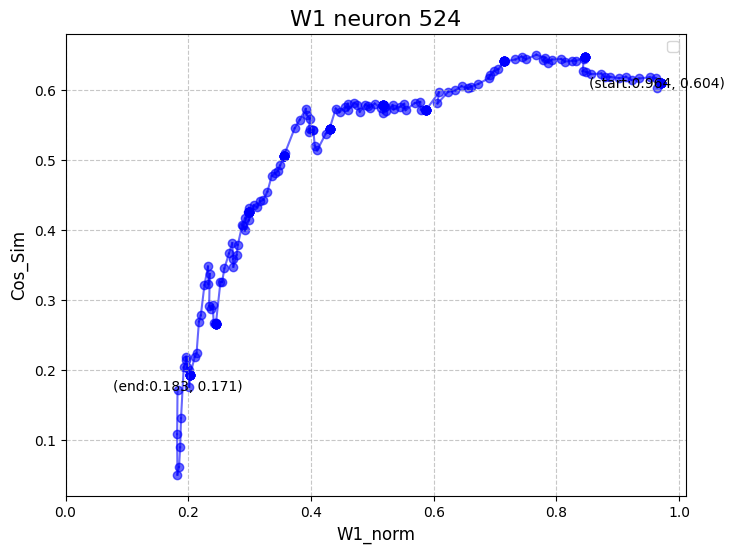

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


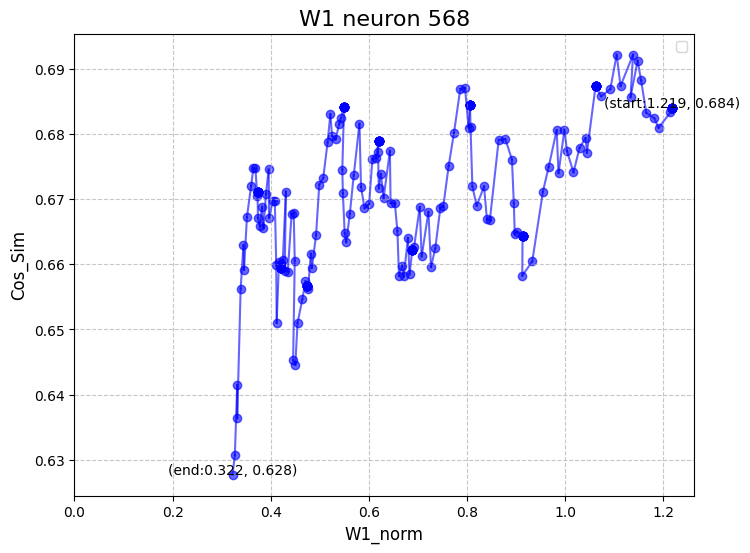

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


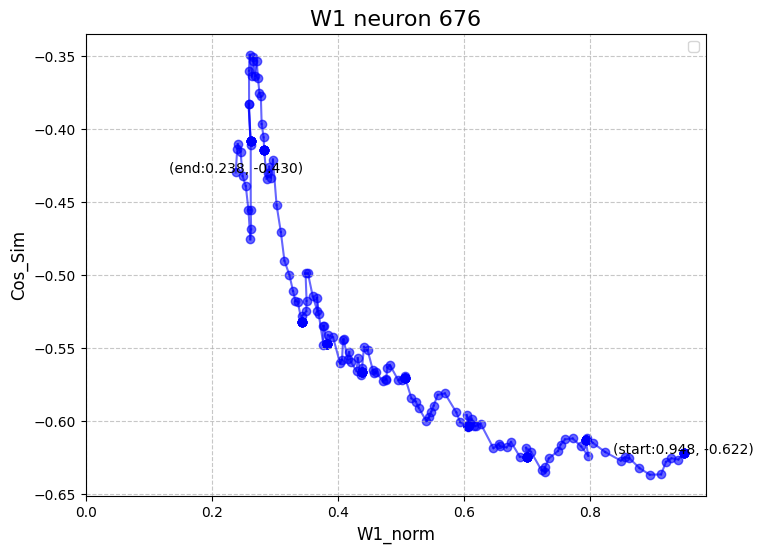

In [21]:
# norm and alignment corresponding to the neuron

for i in range(Spec_neuron_check_num):
     plt.figure(figsize=(8, 6))
     for j in range(1,check_num):
          plt.plot([W1_norm_list[j][W2_check_pos[i]],W1_norm_list[j - 1][W2_check_pos[i]]], [W1_cos_list[j][W2_check_pos[i]],W1_cos_list[j - 1][W2_check_pos[i]]],linestyle='-',  color='b', alpha=0.6)
     for j in range(check_num):
          plt.scatter(W1_norm_list[j][W2_check_pos[i]], W1_cos_list[j][W2_check_pos[i]], color='b', alpha=0.6)
     plt.annotate(f'(start:{W1_norm_list[0][W2_check_pos[i]]:.3f}, {W1_cos_list[0][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[0][W2_check_pos[i]], W1_cos_list[0][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)   
     plt.annotate(f'(end:{W1_norm_list[check_num - 1][W2_check_pos[i]]:.3f}, {W1_cos_list[check_num - 1][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[check_num - 1][W2_check_pos[i]], W1_cos_list[check_num - 1][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)  
     plt.title(f'W1 neuron {W2_check_pos[i]}', fontsize=16)
     plt.xlabel('W1_norm', fontsize=12)
     plt.ylabel('Cos_Sim', fontsize=12)

     plt.grid(True, linestyle='--', alpha=0.7)
     plt.xlim(0, )
     plt.legend()
     plt.show()

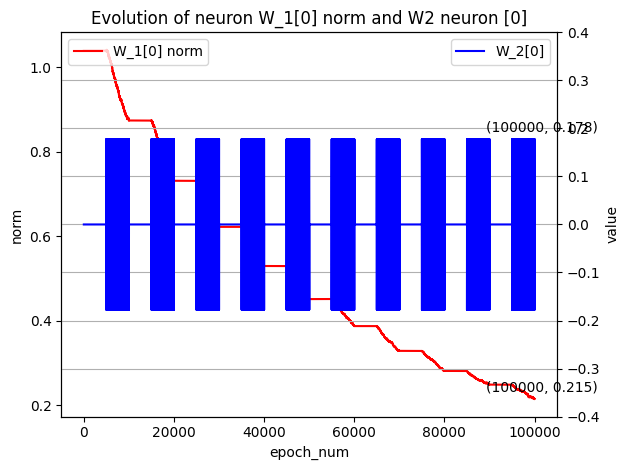

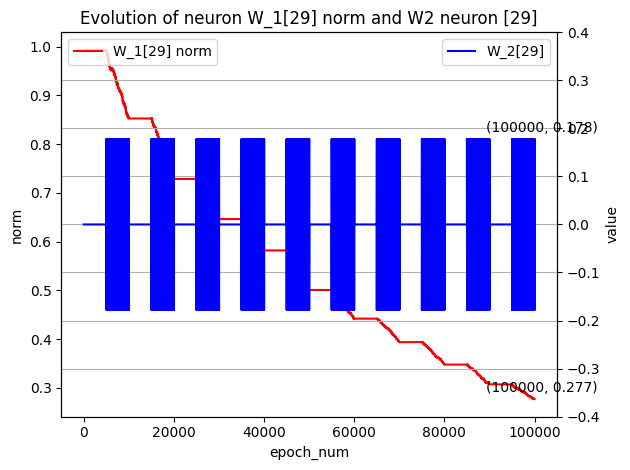

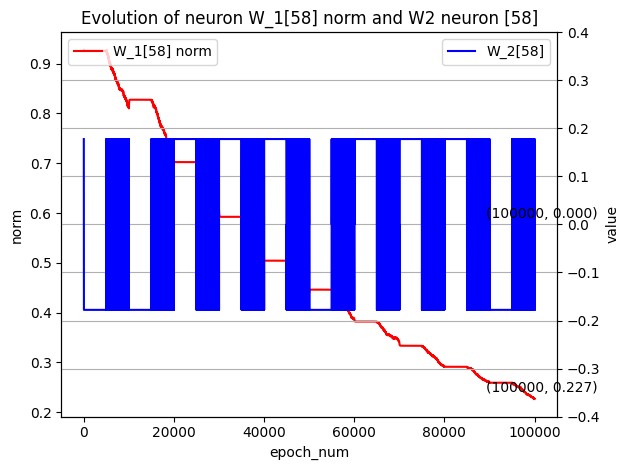

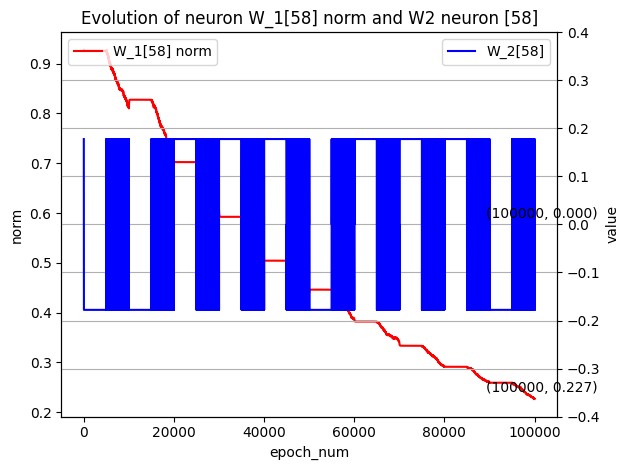

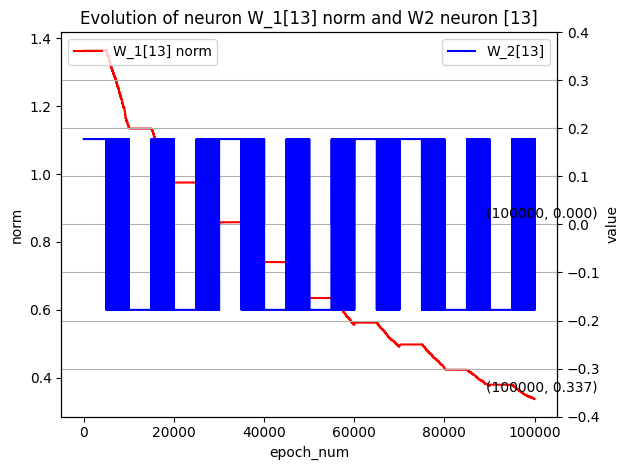

...

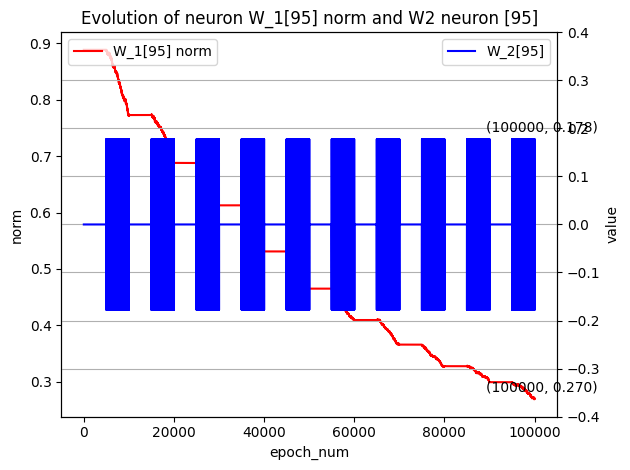

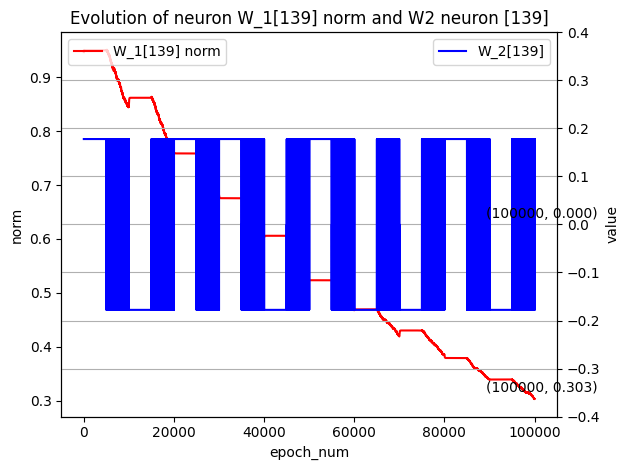

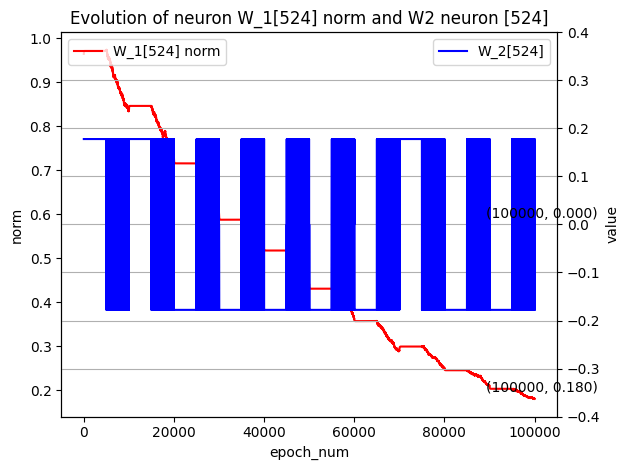

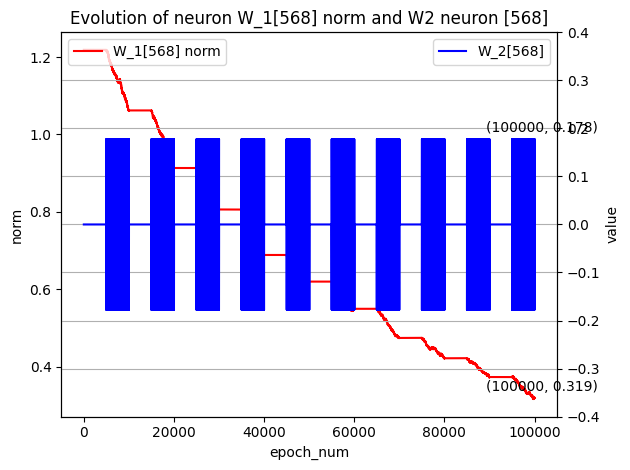

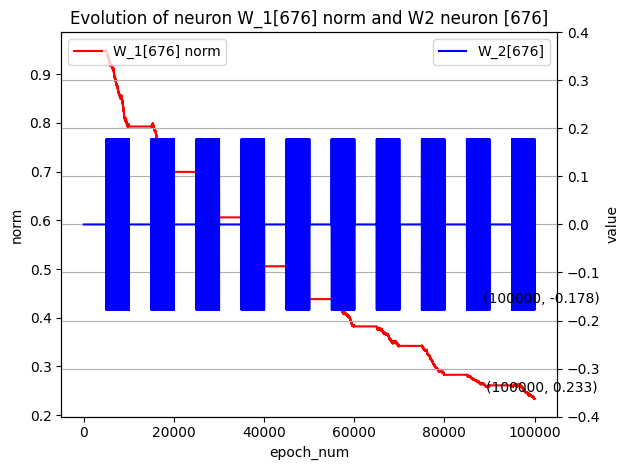

In [22]:
# Seperate norm corresponding to the neuron
test_start = 0
test_end = 100000
x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x[test_start:test_end], W1_spec_norm[i][test_start:test_end], label=f'W_1[{W1_check_pos[i]}] norm', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_norm[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_norm[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] norm and W2 neuron [{W2_check_pos[i]}]')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('norm')
     ax1.legend(loc="upper left")

   
     ax2 = ax1.twinx()
     ax2.plot(x[test_start:test_end], W2_check_list[i][test_start:test_end], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.set_ylim(-0.4,0.4)

     ax2.legend(loc="upper right")
     ax2.grid(True)

     # for ax in (ax1, ax2):
     #      ax.axvline(x=40000, color='green', linestyle='--', linewidth=1)

     fig.tight_layout() 
     plt.show()



In [23]:
for i in range(Spec_neuron_check_num):
     p = []
     for k in range(100):
          p.append(W1_spec_norm[i][k * 20])
     print(W1_check_pos[i], p)

0 [1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.0390665531158447, 1.039066553115844

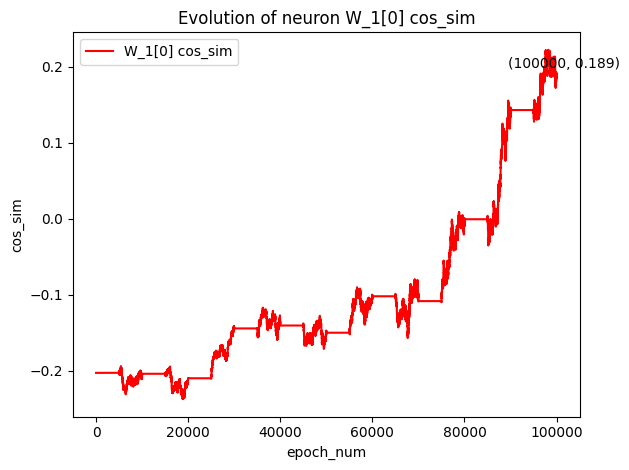

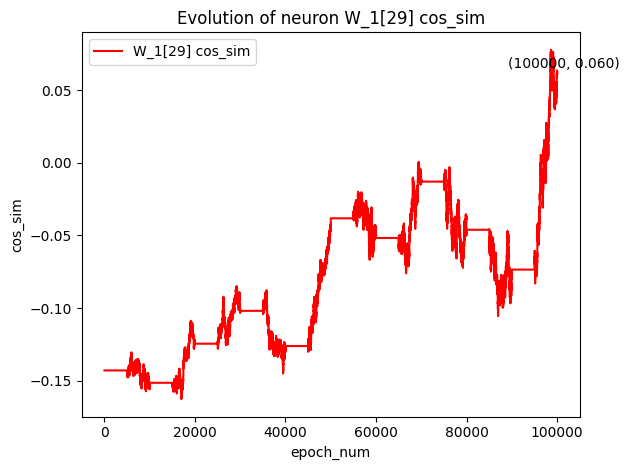

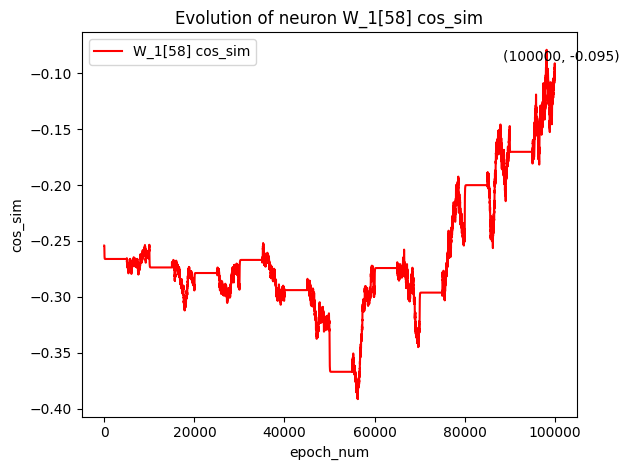

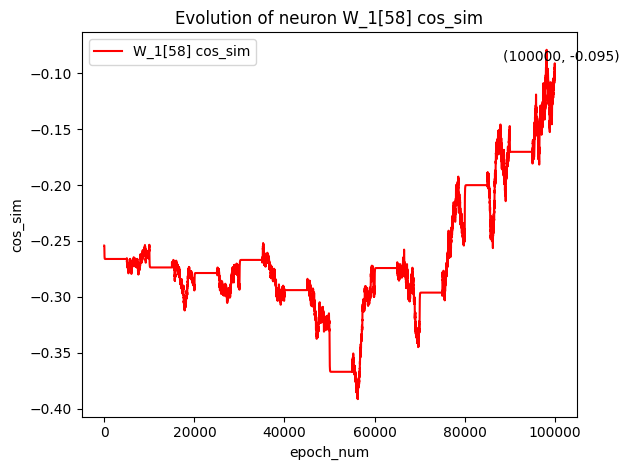

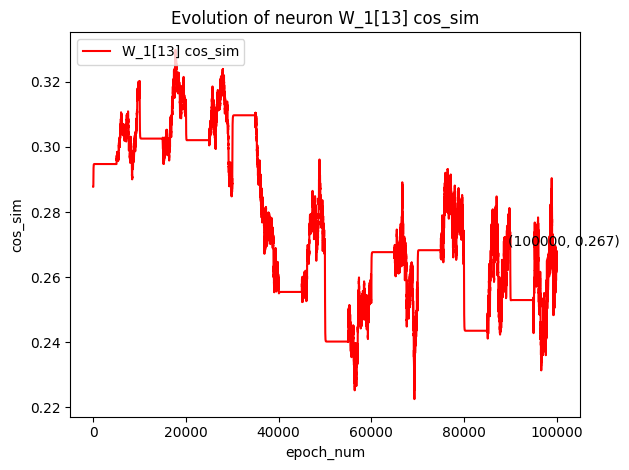

...

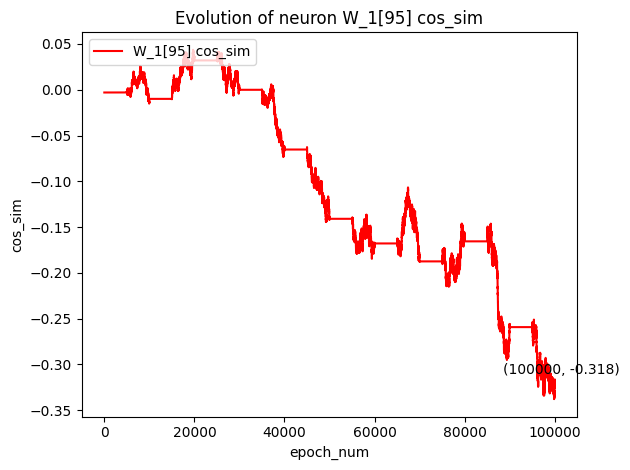

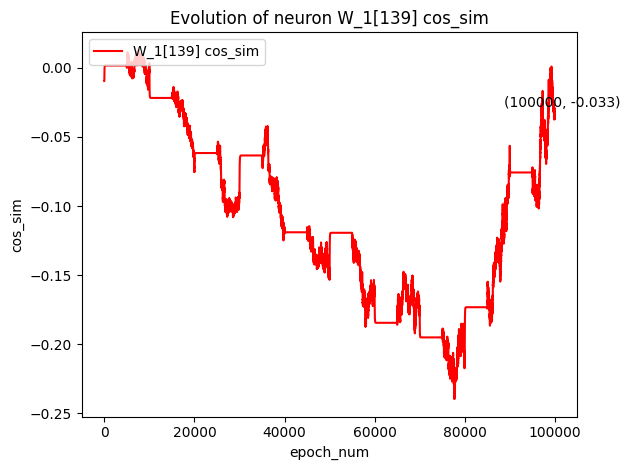

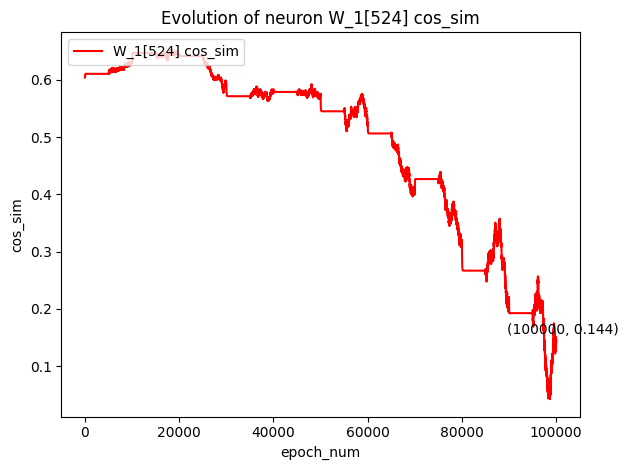

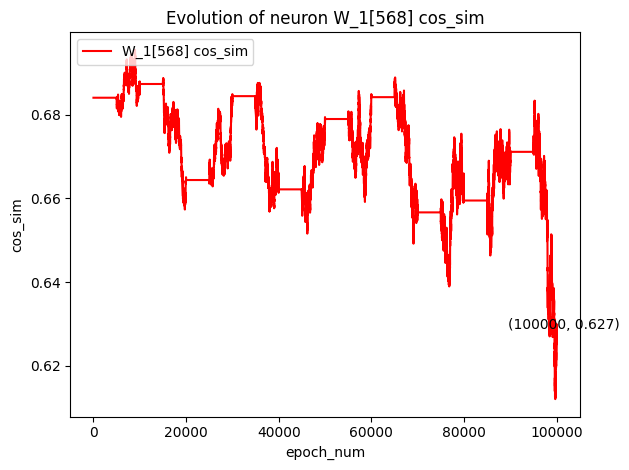

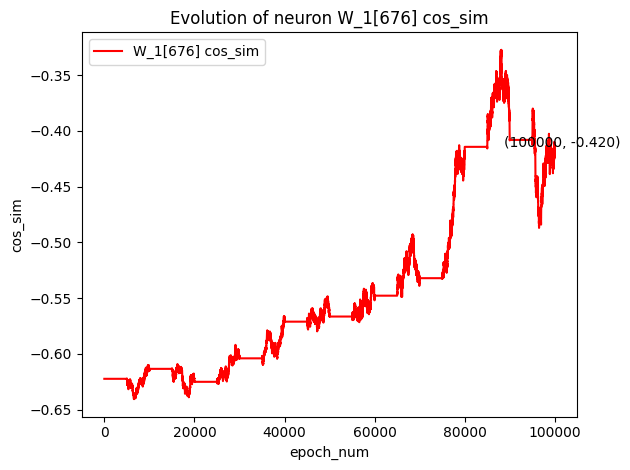

In [24]:
# Cos_sim corresponding to the neuron

x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x, W1_spec_cossim[i], label=f'W_1[{W1_check_pos[i]}] cos_sim', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_cossim[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_cossim[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] cos_sim')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('cos_sim')
     ax1.legend(loc="upper left")


     # ax2 = ax1.twinx()
     # ax2.plot(x, W2_check_list[i], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     # ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
     #             (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
     #             textcoords="offset points",     
     #             xytext=(5, 5),        
     #             ha='center',)   
     # ax2.set_xlabel('epoch_num')
     # ax2.set_ylabel('value')
     # ax2.set_ylim(-0.3,0.3)
     # ax2.legend(loc="upper right")
     # ax2.grid(True)

     fig.tight_layout() 
     plt.show() 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


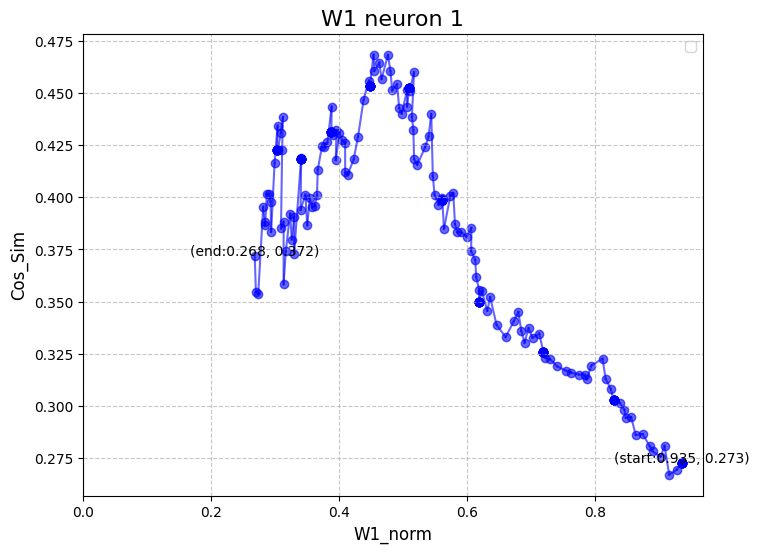

In [26]:
# norm and alignment corresponding to certain neuron
valid_point = 1
plt.figure(figsize=(8, 6))
for j in range(1,check_num):
     plt.plot([W1_norm_list[j][valid_point],W1_norm_list[j - 1][valid_point]], [W1_cos_list[j][valid_point],W1_cos_list[j - 1][valid_point]],linestyle='-',  color='b', alpha=0.6)
for j in range(check_num):
     plt.scatter(W1_norm_list[j][valid_point], W1_cos_list[j][valid_point], color='b', alpha=0.6)
plt.annotate(f'(start:{W1_norm_list[0][valid_point]:.3f}, {W1_cos_list[0][valid_point]:.3f})',  
               (W1_norm_list[0][valid_point], W1_cos_list[0][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)   
plt.annotate(f'(end:{W1_norm_list[check_num - 1][valid_point]:.3f}, {W1_cos_list[check_num - 1][valid_point]:.3f})',  
               (W1_norm_list[check_num - 1][valid_point], W1_cos_list[check_num - 1][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)  
plt.title(f'W1 neuron {valid_point}', fontsize=16)
plt.xlabel('W1_norm', fontsize=12)
plt.ylabel('Cos_Sim', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlim(0, )
plt.legend()
plt.show()

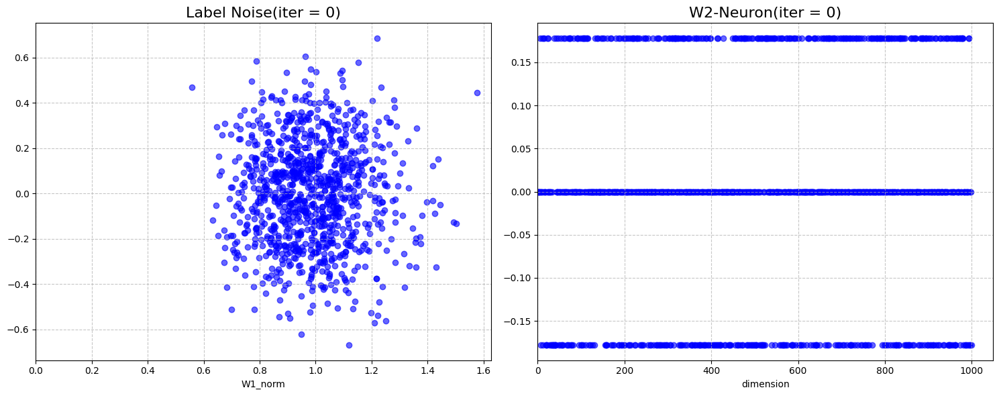

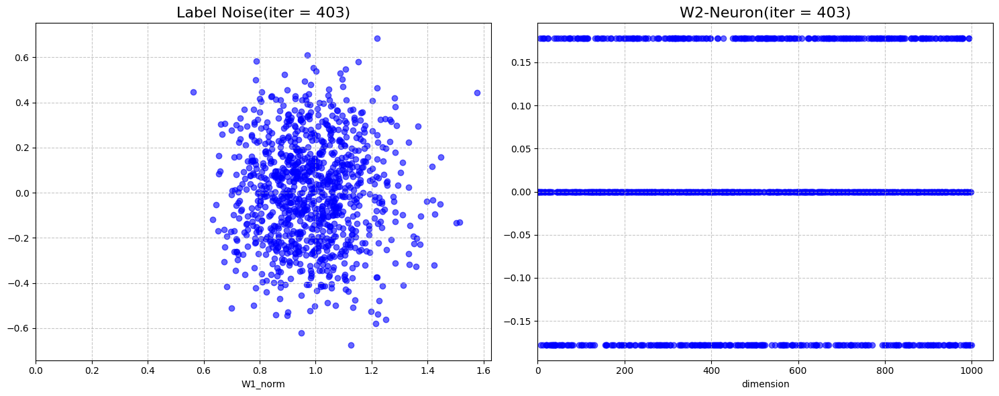

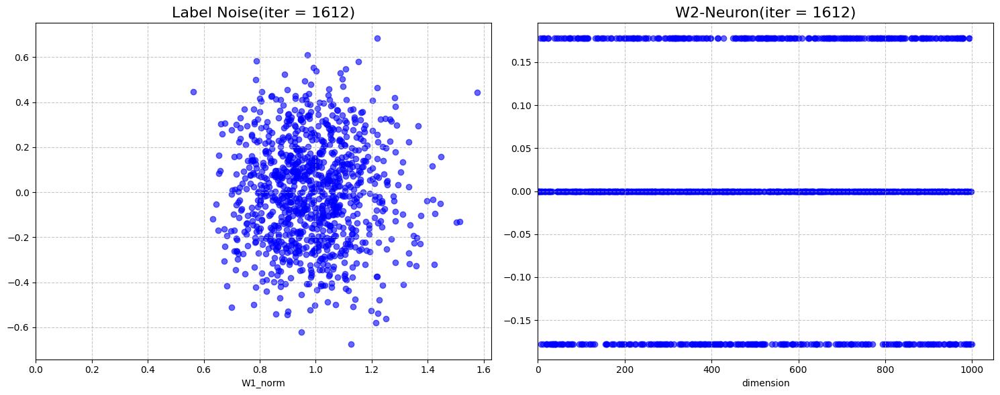

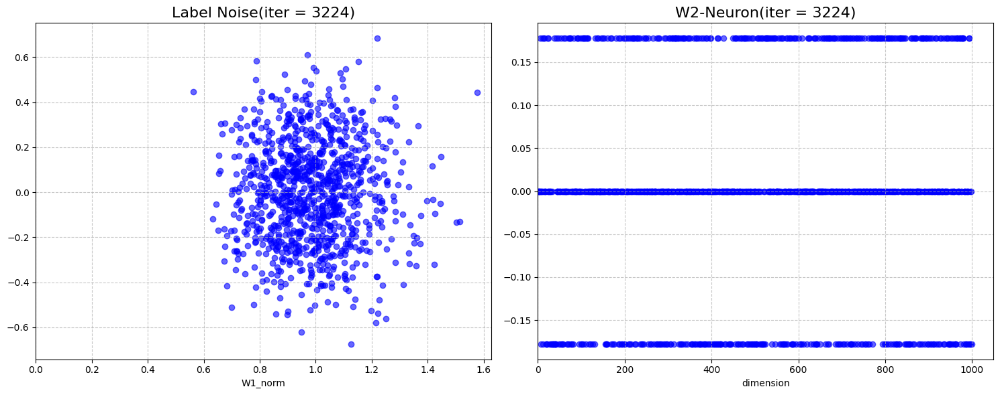

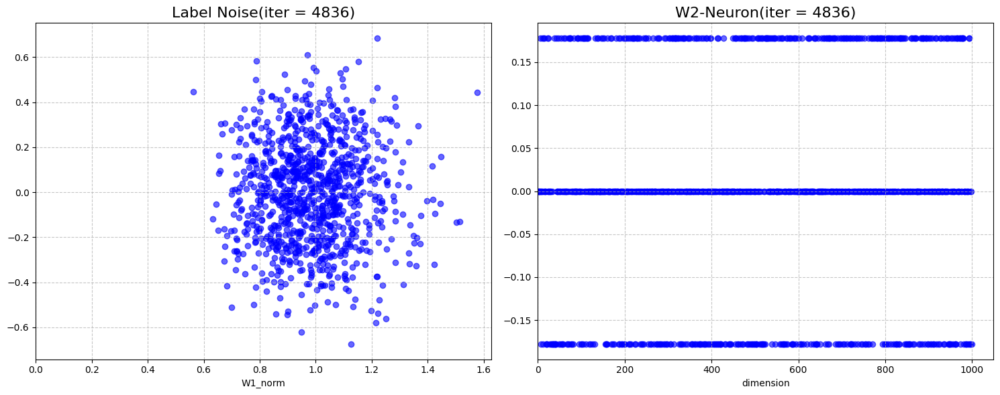

...

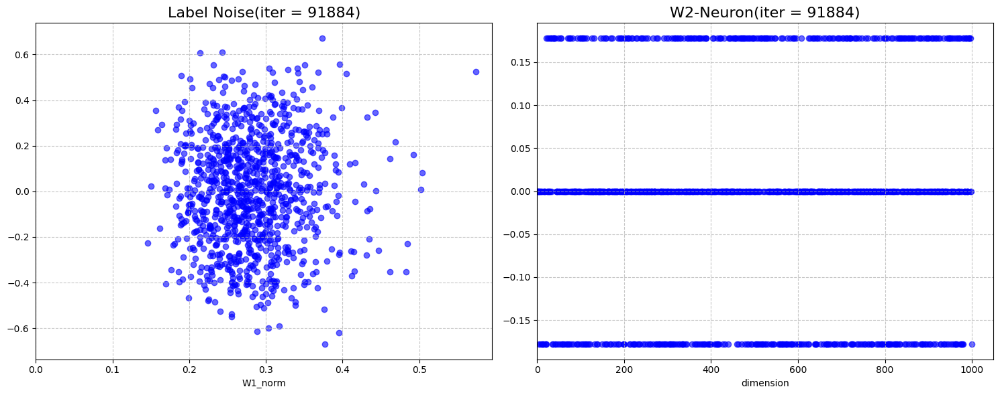

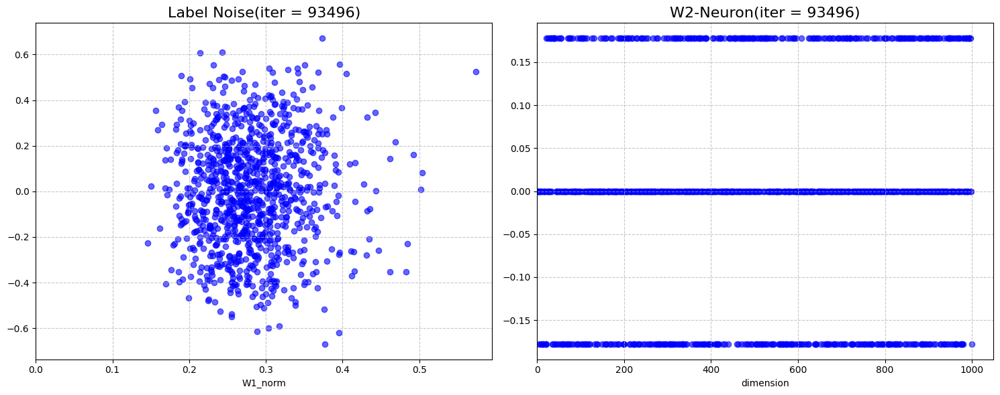

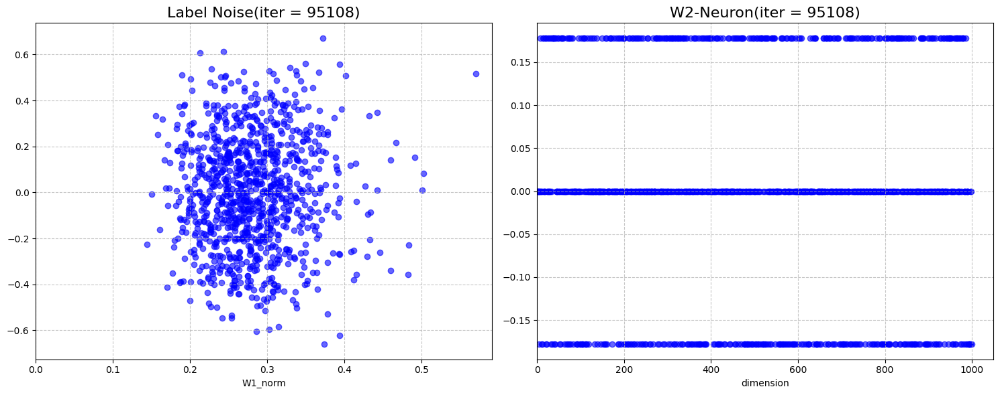

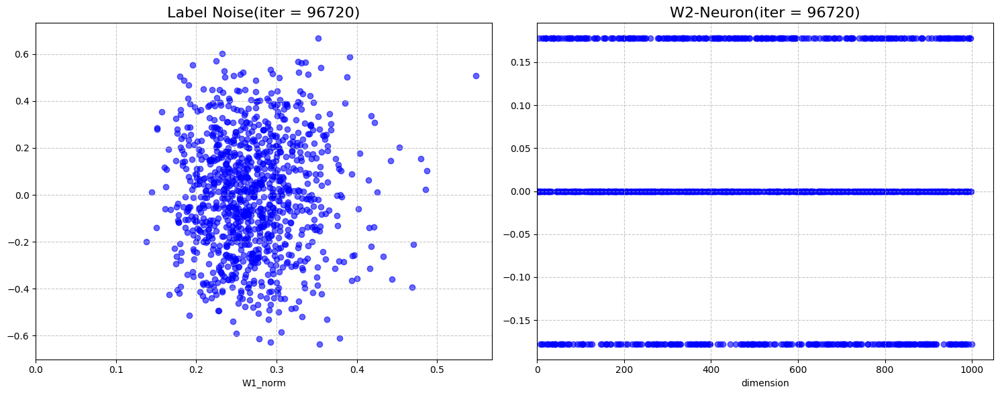

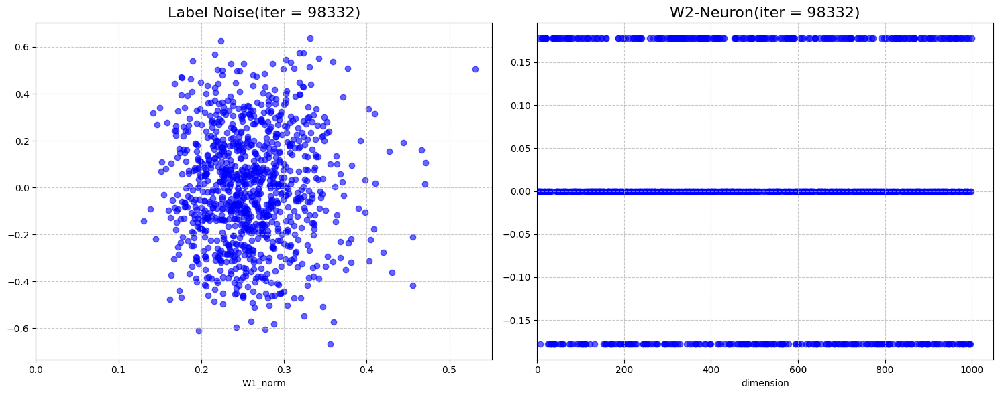

In [29]:
# # compare norm alignment with W2

for i in range(check_num):
     if i % 4 != 0 and i != 1:
          continue
     fig, axes = plt.subplots(1, 2, figsize = (15,6))  # 1行2列的子图
     axes[0].scatter(W1_norm_list[i], W1_cos_list[i], color='b', alpha=0.6)
     axes[0].set_title(f'Label Noise(iter = {check_pos[i]})',fontsize=16)
     axes[0].grid(True, linestyle='--', alpha=0.7)
     axes[0].set_xlim(left=0)
     axes[0].set_xlabel("W1_norm")

     axes[1].scatter(W2_x, W2_list[i], color='b', alpha=0.6)
     axes[1].set_title(f'W2-Neuron(iter = {check_pos[i]})', fontsize=16)
     axes[1].grid(True, linestyle='--', alpha=0.7)
     axes[1].set_xlim(left=0)
     axes[1].set_xlabel("dimension")

     plt.tight_layout()
     plt.show()